In [ ]:
# Sentiment analysis-определяет основные настроения в фрагменте текста. Процесс классификации текста - положительного, 
# отрицательного или нейтрального. Необходим для оценки реакции клиентов.

In [57]:
import pandas as pd
df = pd.read_csv('D:/Python_Projects/Recomendation_Systems/reviews.csv')
df.head()

,Id,ProfileName,ratings,Time,Summary,review
0,1,delmartian,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,dll pa,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,"Natalia Corres ""Natalia Corres""",4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,Karl,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,"Michael D. Bigham ""M. Wassir""",5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [60]:
import matplotlib.pyplot as plt
import seaborn as sns
color = sns.color_palette()
%matplotlib inline
import plotly.offline as py
py.init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.tools as tls
import plotly.express as px

fig = px.histogram(df, x="ratings")
fig.update_traces(marker_color="turquoise",marker_line_color='rgb(8,48,107)',
                  marker_line_width=0.5)
fig.update_layout(title_text='Rating')
fig.show()

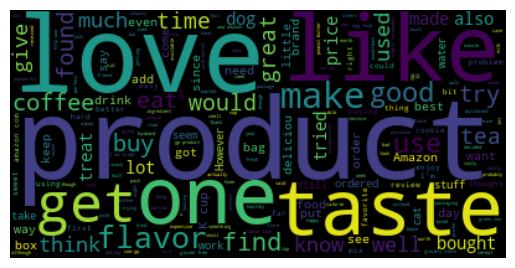

In [61]:
# Создаем несколько облаков слов, чтобы увидеть наиболее часто используемые слова в обзорах.
import nltk
from nltk.corpus import stopwords
from wordcloud import WordCloud 

stopwords1 = set(stopwords.words('english'))
stopwords1.update(["br", "href"])

textt = " ".join(review for review in df.review)
wordcloud = WordCloud(stopwords=stopwords1).generate(textt)

plt.imshow(wordcloud, interpolation='bilinear')
plt.axis("off")
plt.savefig('wordcloud11.png')
plt.show()

In [62]:
# Классификация отзывов на “положительные” и “отрицательные”, чтобы использовать их в качестве обучающих данных.  
# Положительные отзывы будут +1, отрицательные отзывы будут -1. Все отзывы с оценкой > 3 будут +1. Все отзывы с оценкой < 3 
# будут -1. Отзывы с оценкой = 3 будут удалены, так как они нейтральны. 

df = df[df['ratings'] != 3]
df['sentiment'] = df['ratings'].apply(lambda rating : +1 if rating > 3 else -1)
df.head()

,Id,ProfileName,ratings,Time,Summary,review,sentiment
0,1,delmartian,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,1
1,2,dll pa,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,-1
2,3,"Natalia Corres ""Natalia Corres""",4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,1
3,4,Karl,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,-1
4,5,"Michael D. Bigham ""M. Wassir""",5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,1


In [63]:
# Дополнительный анализ данных. Создадим два фрейма - со всеми положительными отзывами и со всеми отрицательными
positive = df[df['sentiment'] == 1]
negative = df[df['sentiment'] == -1]
positive.head()

,Id,ProfileName,ratings,Time,Summary,review,sentiment
0,1,delmartian,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,1
2,3,"Natalia Corres ""Natalia Corres""",4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...,1
4,5,"Michael D. Bigham ""M. Wassir""",5,1350777600,Great taffy,Great taffy at a great price. There was a wid...,1
5,6,Twoapennything,4,1342051200,Nice Taffy,I got a wild hair for taffy and ordered this f...,1
6,7,David C. Sullivan,5,1340150400,Great! Just as good as the expensive brands!,This saltwater taffy had great flavors and was...,1


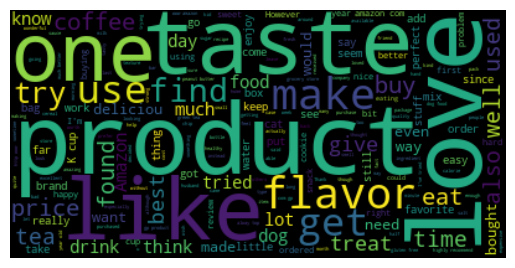

In [64]:
# Выведем облако слов с положительными оценками:
from wordcloud import WordCloud 
stopwords1 = set(stopwords.words('english'))
stopwords1.update(["br", "href","good","great"]) # good и great это стоп слова, так как они были включены в негативное облако
pos = " ".join(str(review) for review in positive.review) 
wordcloud2 = WordCloud(stopwords=stopwords1).generate(pos)
plt.imshow(wordcloud2, interpolation='bilinear')
plt.axis("off")
plt.show()

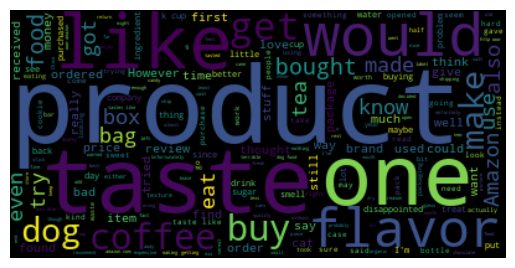

In [65]:
# Выведем облако слов с отрицательными оценками:
from wordcloud import WordCloud 
neg = " ".join(str(review) for review in negative.review)
wordcloud3 = WordCloud(stopwords=stopwords1).generate(neg)
plt.imshow(wordcloud3, interpolation='bilinear')
plt.axis("off")
plt.savefig('wordcloud33.png')
plt.show()

In [66]:
# Распределение отзывов с настроениями по всему облакам:
df['sentimentt'] = df['sentiment'].replace({-1 : 'negative'})
df['sentimentt'] = df['sentimentt'].replace({1 : 'positive'})
fig = px.histogram(df, x="sentiment")
fig.update_traces(marker_color="blue",marker_line_color='rgb(8,48,107)',
                  marker_line_width=1)
fig.update_layout(title_text='Sentiment')
fig.show()

In [ ]:
# Построение модели. Модель будет принимать отзывы в качестве входных данных. Затем сделает прогноз, будет ли отзыв 
# положительным или отрицательным.Это задача классификации, для ее выполнения обучим простую модель логистической регрессии.

In [67]:
# Очистка данных
def remove_punctuation(text):
    final = "".join(u for u in text if u not in ("?", ".", ";", ":",  "!",'"'))
    return final
df['review'] = df['review'].apply(remove_punctuation)
df = df.dropna(subset=['Summary'])
df['Summary'] = df['Summary'].apply(remove_punctuation)
df.head()

,Id,ProfileName,ratings,Time,Summary,review,sentiment,sentimentt
0,1,delmartian,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...,1,positive
1,2,dll pa,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...,-1,negative
2,3,"Natalia Corres ""Natalia Corres""",4,1219017600,Delight says it all,This is a confection that has been around a fe...,1,positive
3,4,Karl,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...,-1,negative
4,5,"Michael D. Bigham ""M. Wassir""",5,1350777600,Great taffy,Great taffy at a great price There was a wide...,1,positive


In [68]:
# Новый фрейм данных должен содержать только два столбца Summary и Sentiment (целевая переменная).
dfNew = df[['Summary','sentiment']]
dfNew.head()

,Summary,sentiment
0,Good Quality Dog Food,1
1,Not as Advertised,-1
2,Delight says it all,1
3,Cough Medicine,-1
4,Great taffy,1


In [69]:
# Разделим фрейм данных на обучающий и тестовый: 80% данных будут использоваться для обучения, 20% для тестирования.

import numpy as np

index = df.index
df['random_number'] = np.random.randn(len(index))
train = df[df['random_number'] <= 0.8]
test = df[df['random_number'] > 0.8]

In [70]:
# Создадим bag of words.Используем countvectorizer для преобразования текста в модель bag of words, которая будет содержать 
# разреженную матрицу целых чисел. Количество вхождений каждого слова будет подсчитано и напечатано. Преобразуем текст в 
# модель набора слов, т.к. алгоритм логистической регрессии не понимает текст.

In [71]:
from sklearn.feature_extraction.text import CountVectorizer
vectorizer = CountVectorizer(token_pattern=r'\b\w+\b')
train_matrix = vectorizer.fit_transform(train['Summary'])
test_matrix = vectorizer.transform(test['Summary'])

from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()

X_train = train_matrix
X_test = test_matrix
y_train = train['sentiment']
y_test = test['sentiment']

lr.fit(X_train,y_train)

C:\Users\sneda\anaconda3\envs\PythonGPU\lib\site-packages\sklearn\linear_model\_logistic.py:458: ConvergenceWarning:

lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression



LogisticRegression()

In [72]:
predictions = lr.predict(X_test)
print(predictions)

[-1  1  1 ...  1  1 -1]


In [73]:
# Тестирование

from sklearn.metrics import confusion_matrix,classification_report
new = np.asarray(y_test)
confusion_matrix(predictions,y_test)

array([[11443,  2302],
       [ 5972, 91767]], dtype=int64)

In [74]:
print(classification_report(predictions,y_test))

              precision    recall  f1-score   support

          -1       0.66      0.83      0.73     13745
           1       0.98      0.94      0.96     97739

    accuracy                           0.93    111484
   macro avg       0.82      0.89      0.85    111484
weighted avg       0.94      0.93      0.93    111484



In [ ]:
## Оценка модели - общая точность модели по тестовым данным около 93%